# Problématique : Comment est-ce que les voyages en taxi évoluent au cours de la journée ?


### Importation des libraires et du dataset

In [1]:
import pandas as pd
import numpy as np
from matplotlib.pyplot import *
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from datetime import datetime
from folium import Map, CircleMarker,Marker
from folium.plugins import MarkerCluster # for clustering the markers 
#from google.colab import files
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.utils import all_estimators
import json
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, ShuffleSplit
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ARDRegression
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor

In [2]:
#csv = files.upload()

In [3]:
#df = pd.read_csv('/content/train.csv')
df = pd.read_csv('C:/Users/anais/Documents/Esilv/S7/Stage/Challenge/train.csv')

### Vérifications sur le dataset

In [4]:
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [5]:
df.isna().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

Il n'y a aucune valeur manquante.

In [6]:
df.nunique()

id                    1458644
vendor_id                   2
pickup_datetime       1380222
dropoff_datetime      1380377
passenger_count            10
pickup_longitude        23047
pickup_latitude         45245
dropoff_longitude       33821
dropoff_latitude        62519
store_and_fwd_flag          2
trip_duration            7417
dtype: int64

In [7]:
df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


In [22]:
# Nous pouvons supprimer la colonne que nous n'allons pas utiliser.

In [8]:
df.pop('store_and_fwd_flag')

0          N
1          N
2          N
3          N
4          N
          ..
1458639    N
1458640    N
1458641    N
1458642    N
1458643    N
Name: store_and_fwd_flag, Length: 1458644, dtype: object

In [ ]:
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,-73.982155,40.767937,-73.964630,40.765602,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,-73.980415,40.738564,-73.999481,40.731152,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,-73.979027,40.763939,-74.005333,40.710087,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,-74.010040,40.719971,-74.012268,40.706718,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,-73.973053,40.793209,-73.972923,40.782520,435


### Voyons si tous les voyages enregistrés sont bien à New York

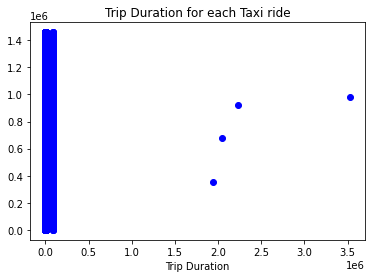

In [ ]:
plt.scatter(df.trip_duration,df.index,color="blue")
plt.xlabel("Trip Duration")
plt.title("Trip Duration for each Taxi ride");

In [ ]:
xlim = [-74.03, -73.77]
ylim = [40.63, 40.85]
df = df[(df.pickup_longitude> xlim[0]) & (df.pickup_longitude < xlim[1])]
df = df[(df.dropoff_longitude> xlim[0]) & (df.dropoff_longitude < xlim[1])]
df = df[(df.pickup_latitude> ylim[0]) & (df.pickup_latitude < ylim[1])]
df = df[(df.dropoff_latitude> ylim[0]) & (df.dropoff_latitude < ylim[1])]

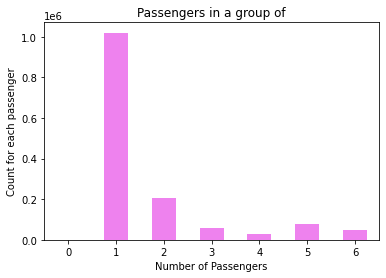

In [ ]:
df["passenger_count"].value_counts().plot(kind='bar',color=["violet"])
plt.title("Passengers in a group of")
plt.xticks(rotation='horizontal')
plt.ylabel("Count for each passenger")
plt.xlabel("Number of Passengers");

In [ ]:
df["passenger_count"].value_counts()

1    1019547
2     207083
5      77100
3      59086
6      47756
4      28001
0         53
Name: passenger_count, dtype: int64

In [ ]:
# We have 53 rides without passenger, we have to remove them.

In [ ]:
df = df[df['passenger_count'] != 0]

In [ ]:
df["passenger_count"].value_counts()

1    1019547
2     207083
5      77100
3      59086
6      47756
4      28001
Name: passenger_count, dtype: int64

## La concentration de taxis dans New York

Nous allons transformer les variables pickup_datetime et dropoff_datetime en date, sinon nous ne pouvons pas les comparer

In [87]:
df.dtypes

id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

In [88]:
def trips_ongoing(excel_filepath,datetime):
    """Return a dataframe with all the trips going at a given time"""
    
    #first, we can gather all the trips that started before the datetime
    df = pd.read_csv(excel_filepath)
    df = df.astype({"pickup_datetime":"datetime64","dropoff_datetime":"datetime64"})
    df = df[df['pickup_datetime'] < datetime]
    #then we can gather all the trips that haven't stoped since
    df = df[df['dropoff_datetime']>datetime]
    
    return df

In [89]:
def visualize_trips(df):
    """Plot the trips on the new york map and return the map"""
    
    #coordinates of New York :
    xlim = [-74.03, -73.77]
    ylim = [40.63, 40.85]
    # We suppress the trips too far away from New York
    df = df[(df.pickup_longitude> xlim[0]) & (df.pickup_longitude < xlim[1])]
    df = df[(df.dropoff_longitude> xlim[0]) & (df.dropoff_longitude < xlim[1])]
    df = df[(df.pickup_latitude> ylim[0]) & (df.pickup_latitude < ylim[1])]
    df = df[(df.dropoff_latitude> ylim[0]) & (df.dropoff_latitude < ylim[1])]
    
    longitude = list(df.pickup_longitude) + list(df.dropoff_longitude)
    latitude = list(df.pickup_latitude) + list(df.dropoff_latitude)
    
    #We map the position of each pickup location
    m = Map(location=[40.767937,-73.982155], zoom_start=13)
    
    stock = list(df['passenger_count'])
    posi = []
    
    for i in range(len(stock)):
        posi.append(stock[i])
        posi.append(stock[i])

    #if the trip doesn't have any passenger, we make them red    
    for i in range(len(longitude)):
        if(posi[i] !=0):
            col = "#3186cc"
        else:
            col = "crimson"
            
        #we add the circles on the map : one circle = one taxi 
        CircleMarker(
        location=[latitude[i], longitude[i]],
        radius=8,
        popup="Laurelhurst Park",
        color=col,
        fill=True,
        fill_color=col,
        ).add_to(m)

    return m

In [91]:
df_test = trips_ongoing('C:/Users/anais/Documents/Esilv/S7/Stage/Challenge/train.csv', datetime(2016,6,7,11))

In [94]:
m = visualize_trips(df_test)
m

## Points de concentration majeurs sur une période donnée

### Avec des tableaux :

In [ ]:
# Puisque les données datent toutes de 2016, essayons d'observer le nombre de voyages par mois

In [5]:
df['pickup_datetime'] = pd.to_datetime(df.pickup_datetime)
df['pickup_year']= df['pickup_datetime'].dt.year
df['pickup_month'] = df['pickup_datetime'].dt.month
df['pickup_day']= df['pickup_datetime'].dt.day
df['pickup_hour'] = df['pickup_datetime'].dt.hour
df['pickup_min']= df['pickup_datetime'].dt.minute
df['pickup_sec']=df['pickup_datetime'].dt.second

df['dropoff_datetime'] = pd.to_datetime(df.dropoff_datetime)
df['dropoff_year']= df['dropoff_datetime'].dt.year
df['dropoff_month'] = df['dropoff_datetime'].dt.month
df['dropoff_day']= df['dropoff_datetime'].dt.day
df['dropoff_hour'] = df['dropoff_datetime'].dt.hour
df['dropoff_min']= df['dropoff_datetime'].dt.minute
df['dropoff_sec']=df['dropoff_datetime'].dt.second

In [ ]:
def NbTripsByMonth(df,year):
    plt.figure(figsize=(15, 6)) 
    df.pickup_month.value_counts().plot(kind='bar',color=["violet"],align='center',width=0.3)
    plt.xticks(rotation='horizontal')
    plt.xlabel("Months")
    plt.ylabel("Number of trips")
    plt.title(f"Number of trips by month in {year}");

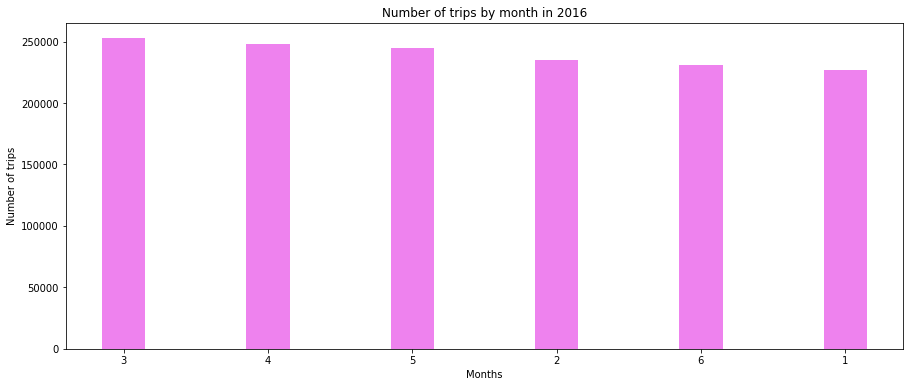

In [ ]:
NbTripsByMonth(df,2016)

In [ ]:
def TripsPerMonth(dfo,month):
    #si month = 0 alors on prend pickup_month
    if(month == 0):
        df = dfo.pickup_month
    #sinon :
    else:
        df = dfo[dfo.pickup_datetime.dt.month == month ]
        df = df.pickup_day
    
    month_str = ""
    if(month==0):
        month_str="2016"
    elif(month==1):
        month_str="Janvier"
    elif(month==2):
         month_str="Février"
    elif(month==3):
         month_str="Mars"
    elif(month==4):
         month_str="Avril"
    elif(month==5):
         month_str="Mai"
    elif(month==6):
         month_str="Juin"
    elif(month==7):
         month_str="Juillet"
    elif(month==8):
         month_str="Aout"
    elif(month==9):
         month_str="Septembre"
    elif(month==10):
         month_str="Octobre"
    elif(month==11):
         month_str="Novembre"
    elif(month==12):
        month_str="Décembre"
    
    if(month == 0):
        xlabel_str = "Mois"
        title_str = f"Nombre de voyage par mois en {month_str}"
    else:
        xlabel_str="Jour"
        title_str = f"Nombre de voyage par jour en {month_str}"
    
    plt.figure(figsize=(15, 6)) 
    df.value_counts().plot(kind='bar',color=["violet"],align='center',width=0.3)
    plt.xticks(rotation='horizontal')
    plt.xlabel(xlabel_str)
    plt.ylabel("Nombre de voyage")
    plt.title(title_str);

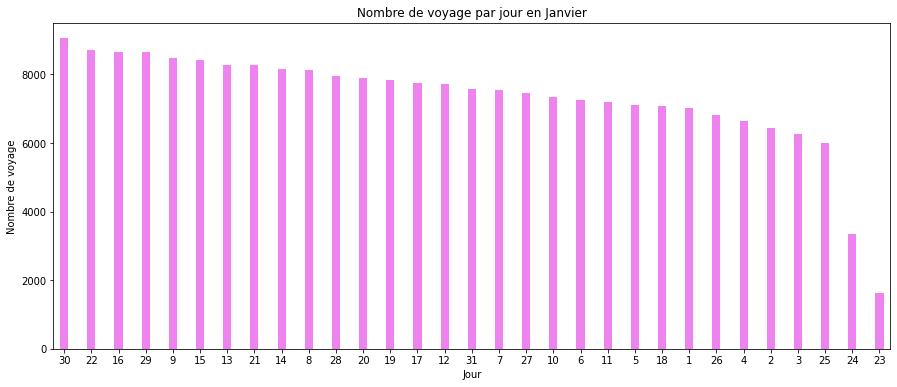

In [ ]:
TripsPerMonth(df,1)

### Avec une carte :

In [ ]:
def ClustersPerMonth(dfo,month=0, week = 0, day=0, weekday = -1, hour= -1):
  """Takes the month and the number of clusters wanted, and returns a map with the clusters, and their coordinates"""

  #we select the month wanted (from 1 to 12)
  if (month != 0):
    df = dfo[dfo.pickup_datetime.dt.month == month ]
  else:
    df = dfo

  #we select the wanted week (from 1 to 52)
  if (week != 0):
    df = df[df.pickup_datetime.dt.isocalendar().week == week]

  #we select the wanted day (from 1 to 31)
  if (day!=0):
    df = df[df.pickup_datetime.dt.day == day]
  
  #we select the wanted weekday (from 0 to 6)
  if (weekday != -1):
    df = df[df.pickup_datetime.dt.weekday == weekday] 

  #we select the wanted hour (from 0 to 23)
  if (hour != -1):
    df = df[df.pickup_datetime.dt.hour == hour] 

  #si la date entrée n'existe pas, on prend toute la base de données
  if (len(df)==0):
    print("La date entrée n'existe pas ou aucun trajet n'a été effectué à cette date.")
    df = dfo

  print('les données correspondantes ont été sélectionnées')
  print(f'{len(df)} voyages correspondent')
  longitude = list(df.pickup_longitude) + list(df.dropoff_longitude)
  latitude = list(df.pickup_latitude) + list(df.dropoff_latitude)
  loc_df = pd.DataFrame()
  loc_df['longitude'] = longitude
  loc_df['latitude'] = latitude

  #kmeans = KMeans(n_clusters=nbClusters, random_state=2, n_init = 10).fit(loc_df)
  #loc_df['label'] = kmeans.labels_

  m = Map(location=[40.767937,-73.982155], zoom_start=12)
  print("la map a été générée")
  marker_cluster = MarkerCluster().add_to(m) # create marker clusters
  print("les clusters sont en cours d'ajout...")

  for coo in range(len(loc_df['longitude'])):
    if(coo%1000==0):
      print(f'[{coo}/{len(loc_df["longitude"])}] markers ajoutés')
    location = [latitude[coo],longitude[coo]]
    tooltip = "Coordinates : {} <br>".format(location)
    folium.Marker(location, # adding more details to the popup screen using HTML
                    tooltip=tooltip).add_to(marker_cluster)

  print("Tous les markers ont été ajoutés !")
  return m



In [ ]:
m = ClustersPerMonth(df,month=1,hour = 11)
m.save("./map.html")

les données correspondantes ont été sélectionnées
10567 voyages correspondent
la map a été générée
les clusters sont en cours d'ajout...
[0/21134] markers ajoutés
[1000/21134] markers ajoutés
[2000/21134] markers ajoutés
[3000/21134] markers ajoutés
[4000/21134] markers ajoutés
[5000/21134] markers ajoutés
[6000/21134] markers ajoutés
[7000/21134] markers ajoutés
[8000/21134] markers ajoutés
[9000/21134] markers ajoutés
[10000/21134] markers ajoutés
[11000/21134] markers ajoutés
[12000/21134] markers ajoutés
[13000/21134] markers ajoutés
[14000/21134] markers ajoutés
[15000/21134] markers ajoutés
[16000/21134] markers ajoutés
[17000/21134] markers ajoutés
[18000/21134] markers ajoutés
[19000/21134] markers ajoutés
[20000/21134] markers ajoutés
[21000/21134] markers ajoutés
Tous les markers ont été ajoutés !


In [ ]:
m

## Les heures de pointes habituelles :

In [164]:
def HeuresDePointes(dfo,month=0, week = 0, day=0, weekday = -1):

  #we select the month wanted (from 1 to 12)
  if (month != 0):
    df = dfo[dfo.pickup_datetime.dt.month == month ]
  else:
    df = dfo

  #we select the wanted week (from 1 to 52)
  if (week != 0):
    df = df[df.pickup_datetime.dt.isocalendar().week == week]

  #we select the wanted day (from 1 to 31)
  if (day!=0):
    df = df[df.pickup_datetime.dt.day == day]
  
  #we select the wanted weekday (from 0 to 6)
  if (weekday != -1):
    df = df[df.pickup_datetime.dt.weekday == weekday] 


  #si la date entrée n'existe pas, on prend toute la base de données
  if (len(df)==0):
    print("La date entrée n'existe pas ou aucun trajet n'a été effectué à cette date.")
    df = dfo

  fig, ax = subplots(figsize=(15,10))
  hour_plot = sns.countplot(ax=ax,x='pickup_hour', palette='ch:.25', data=df.sort_values(by=['pickup_hour']))
  hour_plot.set_xticklabels(hour_plot.get_xticklabels(), rotation=40, ha="right")
  return hour_plot

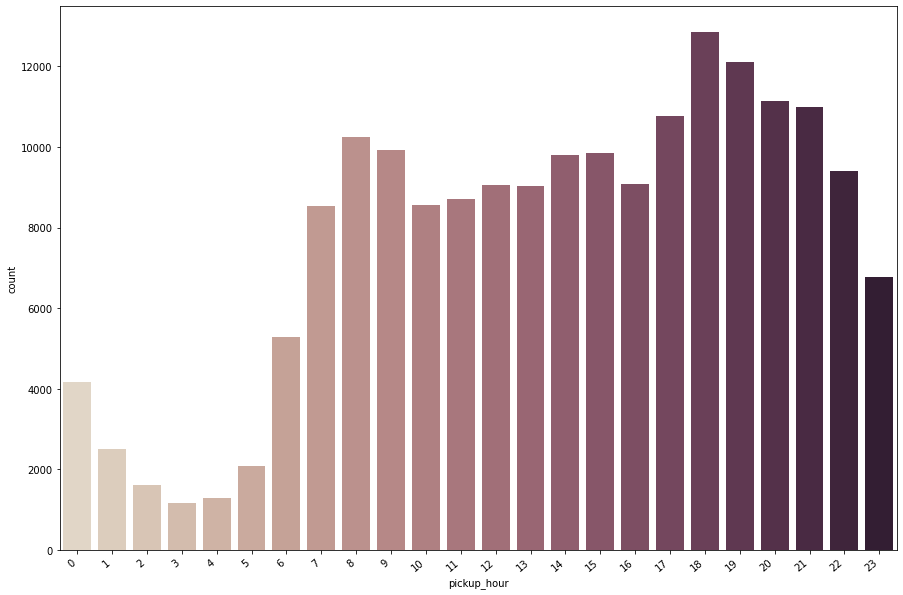

In [166]:
HeuresDePointes(df,weekday=0)

### Vérifions que notre dataset est prêt :


*   **Variables catégoriques : One hot encoding**
*   **Variables numériques : Normalisation et Standardisation**




### One hot encoding 

In [13]:
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,...,pickup_day,pickup_hour,pickup_min,pickup_sec,dropoff_year,dropoff_month,dropoff_day,dropoff_hour,dropoff_min,dropoff_sec
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,455,...,14,17,24,55,2016,3,14,17,32,30
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,663,...,12,0,43,35,2016,6,12,0,54,38
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,2124,...,19,11,35,24,2016,1,19,12,10,48
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,429,...,6,19,32,31,2016,4,6,19,39,40
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,435,...,26,13,30,55,2016,3,26,13,38,10


Les variables pickup_datetime et dropoff_datetime n'étant pas numériques, et étant exprimées avec les variables pickup_year, pickup_month.. nous pouvons les supprimer. La variable id ne nous sert à rien non plus.

In [6]:
df.pop('pickup_datetime')
df.pop('dropoff_datetime')
df.pop('id')

0          id2875421
1          id2377394
2          id3858529
3          id3504673
4          id2181028
             ...    
1458639    id2376096
1458640    id1049543
1458641    id2304944
1458642    id2714485
1458643    id1209952
Name: id, Length: 1458644, dtype: object

In [22]:
df.head()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,pickup_year,pickup_month,pickup_day,pickup_hour,pickup_min,pickup_sec,dropoff_year,dropoff_month,dropoff_day,dropoff_hour,dropoff_min,dropoff_sec
0,2,1,-73.982155,40.767937,-73.964630,40.765602,455,2016,3,14,17,24,55,2016,3,14,17,32,30
1,1,1,-73.980415,40.738564,-73.999481,40.731152,663,2016,6,12,0,43,35,2016,6,12,0,54,38
2,2,1,-73.979027,40.763939,-74.005333,40.710087,2124,2016,1,19,11,35,24,2016,1,19,12,10,48
3,2,1,-74.010040,40.719971,-74.012268,40.706718,429,2016,4,6,19,32,31,2016,4,6,19,39,40
4,2,1,-73.973053,40.793209,-73.972923,40.782520,435,2016,3,26,13,30,55,2016,3,26,13,38,10


Les variables catégoriques à encoder sont les suivantes:

* vendor_id
* pickup_year
* pickup_month
* pickup_day
* pickup_hour
* pickup_min
* pickup_sec
* dropoff_year
* dropoff_month
* dropoff_day
* dropoff_hour
* dropoff_min
* dropoff_sec

In [7]:
encoder = OneHotEncoder(sparse=False)

df[encoder.get_feature_names(["has_vendor_id", "pick_year","pick_month","pick_day","pick_hour","pick_min", "pick_sec","drop_year","drop_month","drop_day","drop_hour","drop_min","drop_sec"])] =\
    encoder.fit_transform(df[['vendor_id','pickup_year','pickup_month','pickup_day',
                       'pickup_hour','pickup_min','pickup_sec','dropoff_year',
                       'dropoff_month','dropoff_day','dropoff_hour','dropoff_min'
                       ,'dropoff_sec']])
df.drop(['vendor_id','pickup_year','pickup_month','pickup_day',
                       'pickup_hour','pickup_min','pickup_sec','dropoff_year',
                       'dropoff_month','dropoff_day','dropoff_hour','dropoff_min','dropoff_sec'], axis=1, inplace=True)
df.head()

,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,has_vendor_id_1,has_vendor_id_2,pick_year_2016,pick_month_1,...,drop_sec_50,drop_sec_51,drop_sec_52,drop_sec_53,drop_sec_54,drop_sec_55,drop_sec_56,drop_sec_57,drop_sec_58,drop_sec_59
0,1,-73.982155,40.767937,-73.964630,40.765602,455,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,-73.980415,40.738564,-73.999481,40.731152,663,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,-73.979027,40.763939,-74.005333,40.710087,2124,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,-74.010040,40.719971,-74.012268,40.706718,429,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,-73.973053,40.793209,-73.972923,40.782520,435,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Standardisation et normalisation

Maintenant que nos variables catégoriques sont prêtes, affichons les histogrammes des variables numériques. Pour des raisons de limitations matérielles, nous ne prenons que les 10000 premières lignes

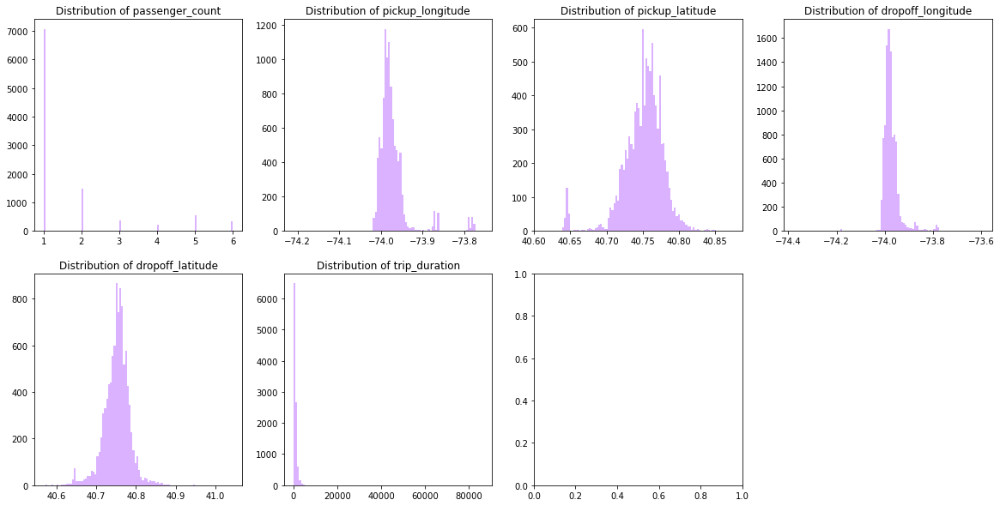

In [9]:
df_temp = df[:10000]
N = len(df_temp) // 100
numerical_columns = ['passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
                     'trip_duration']

plt.rcParams['figure.figsize'] = [20, 10] # default = [6.0, 4.0]
fig, axes = plt.subplots(2, 4)
axes = axes.flatten()
axes[-1].remove()
for column, ax in zip(numerical_columns, axes):
    ax.hist(x=df_temp[column], bins=N, color='#8800ff', alpha=0.3)
    # add legends
    ax.set_title(f'Distribution of {column}')


In [27]:
df[numerical_columns].describe()

,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


Je vais normaliser trip_duration et passenger_count puisque je veux garder le même 0. Je vais standardiser les autres variables.

In [10]:
transformations = {}
# standardization
for column in ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']:
    mean, std = df_temp[column].mean(), df_temp[column].std()
    transformations[column] = {'function' : 'standardization', 'mean': float(mean), 'std': float(std)}

    
# Normalization
for column in ['trip_duration', 'passenger_count']:
    maxi = df_temp[column].max()
    transformations[column] = {'function' : 'normalization', 'maxi': float(maxi)}

# save file
with open('transformations.json', 'w') as f:
    json.dump(transformations, f, indent=4)

In [11]:
def norm_from_file(df, file_name):
    _df = df.copy()
    with open(file_name) as f:
         transformations = json.load(f)


    for column, t in transformations.items():
        if t['function'] == 'standardization':
            _df[column] = (_df[column] - t['mean']) / t['std']
        elif t['function'] == 'normalization':
            _df[column] = _df[column] / t['maxi']

    return _df

data = norm_from_file(df_temp, 'transformations.json')
data

,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,has_vendor_id_1,has_vendor_id_2,pick_year_2016,pick_month_1,...,drop_sec_50,drop_sec_51,drop_sec_52,drop_sec_53,drop_sec_54,drop_sec_55,drop_sec_56,drop_sec_57,drop_sec_58,drop_sec_59
0,0.166667,-0.232652,0.604634,0.233710,0.426501,0.005269,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.166667,-0.187507,-0.445830,-0.720720,-0.635816,0.007677,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.166667,-0.151471,0.461661,-0.880975,-1.285369,0.024596,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.166667,-0.956347,-1.110760,-1.070900,-1.389237,0.004968,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.166667,0.003564,1.508441,0.006594,0.948191,0.005037,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.166667,-0.537178,0.207777,0.654093,2.344107,0.011244,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9996,0.333333,-0.623705,-1.134497,-0.369495,0.293932,0.010792,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9997,0.166667,-0.363333,0.354978,-0.246012,0.508490,0.004308,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9998,0.166667,-0.049302,0.180492,0.125689,0.396270,0.003416,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


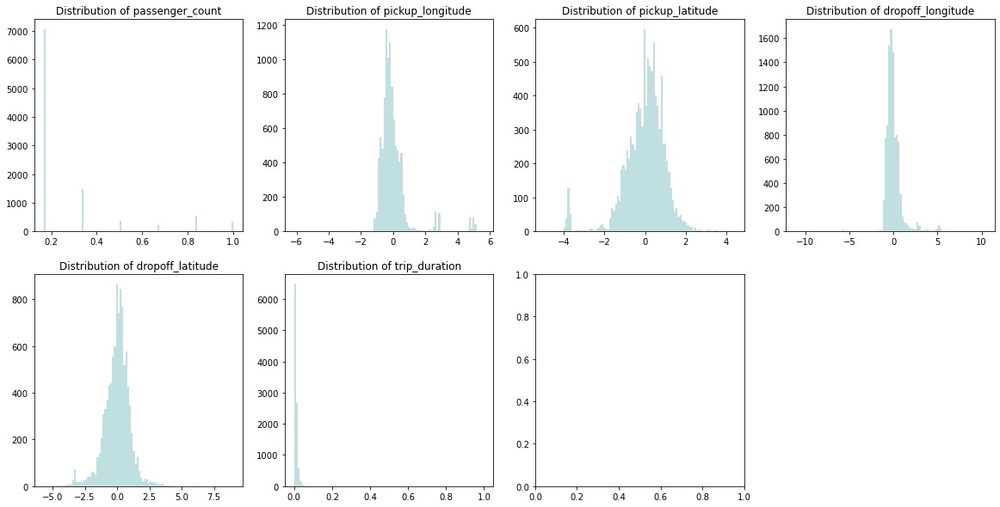

In [70]:
N = len(data) // 100
numerical_columns = ['passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
                     'trip_duration']

plt.rcParams['figure.figsize'] = [20, 10] # default = [6.0, 4.0]
fig, axes = plt.subplots(2, 4)
axes = axes.flatten()
axes[-1].remove()
for column, ax in zip(numerical_columns, axes):
    ax.hist(x=data[column], bins=N, color='#2f9599', alpha=0.3)
    # add legends
    ax.set_title(f'Distribution of {column}')


### Train-test split

In [12]:
X, y = data.drop('trip_duration', axis=1), data['trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (7000, 372)
y_train shape: (7000,)
X_test shape: (3000, 372)
y_test shape: (3000,)


## Prédiction du temps de trajet

Nous avons un problème de regression. J'ai besoin de tester plusieurs modèles de regression. Pour commencer, affichons les modèles disponibles avec sklearn.

In [177]:
all_regs = np.array([name for name, RegressorClass in all_estimators(type_filter='regressor')])
for i in range(0, len(all_regs) // 3, 3):
    j = min(i + 3, len(all_regs))
    print('| '.join([f'{reg:30}' for reg in all_regs[i:j]]))

ARDRegression                 | AdaBoostRegressor             | BaggingRegressor              
BayesianRidge                 | CCA                           | DecisionTreeRegressor         
DummyRegressor                | ElasticNet                    | ElasticNetCV                  
ExtraTreeRegressor            | ExtraTreesRegressor           | GaussianProcessRegressor      
GradientBoostingRegressor     | HistGradientBoostingRegressor | HuberRegressor                
IsotonicRegression            | KNeighborsRegressor           | KernelRidge                   


Ne pouvant pas tous les tester, j'ai choisi les modèles suivants : 

* LinearRegression
* ElasticNet
* HuberRegressor
* BayesianRidge
* ARDRegression
* KNeighborsRegressor
* RandomForestRegressor

#### Petit sommaire :

Pour chaque modèle je vais :

* effectuer un GridSearch sur les hyperparamètres
* ploter les résultats
* calculer la RMSE pour pouvoir la comparer avec les autres modèles

Pour calculer la RMSE :

In [13]:
MEAN_LOG_T_TRIP = df_temp.trip_duration.mean()
STD_LOG_T_TRIP = df_temp.trip_duration.std()
print(MEAN_LOG_T_TRIP)
print(STD_LOG_T_TRIP)

920.2059
2873.6174427062992


In [14]:
def target_unfit(y):
    y = (y * STD_LOG_T_TRIP + MEAN_LOG_T_TRIP) ** 2
    return y

def RMSE(pred, y, unfit=True):
    if unfit:
        pred = target_unfit(pred)
        y = target_unfit(y)
    error = pred - y
    rsme_error = np.sqrt((error ** 2).mean())
    return rsme_error

La dernière mais pas des moindres, la fonction gridsearch :Elle effectue une cross-validation mélangeant le training set en 4 parties.

In [15]:
def grid_search(X, y, model, param_grid={}):
    rkwargs = {'random_state':42}
    try:
        model(**rkwargs)
    except:
        rkwargs = {}
        
    grid = GridSearchCV(
        model(**rkwargs),
        param_grid=param_grid,
        cv=ShuffleSplit(n_splits=4, random_state=42),
        verbose=0,
        n_jobs=-1
    )

    grid.fit(X, y)
    return grid


### Linear Regression

In [16]:
model = LinearRegression
model_name = type(model()).__name__

param_grid = {
    'fit_intercept': [True, False],
    'normalize': [True, False]
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [17]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()

,param_fit_intercept,param_normalize,params,mean_test_score,std_test_score,rank_test_score
0,True,True,"{'fit_intercept': True, 'normalize': True}",-39.139456,38.353599,1
1,True,False,"{'fit_intercept': True, 'normalize': False}",-45.039058,45.552263,2
2,False,True,"{'fit_intercept': False, 'normalize': True}",-45.209460,45.690378,3
3,False,False,"{'fit_intercept': False, 'normalize': False}",-45.209460,45.690378,3


In [18]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde :

In [19]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_
          
RESULTS = pd.DataFrame.from_dict(data={'model': [model_name], 'RMSE':[rmse]})
RESULTS

,model,RMSE
0,LinearRegression,2.745954e+06


###  Elastic Net

In [74]:
model = ElasticNet
model_name = type(model()).__name__

param_grid = {
    'alpha': [0.1, 0.25, 0.5, 0.75, 0.9, 1],
    'l1_ratio': [0, 0.2, 0.5, 0.7, 1], 
    'max_iter': [1000] #could be bigger but takes way too much time
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [75]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()

C:\Users\anais\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.4670392718508145, tolerance: 0.0009027258343302056
  positive)


,param_alpha,param_l1_ratio,param_max_iter,params,mean_test_score,std_test_score,rank_test_score
5,0.25,0,1000,"{'alpha': 0.25, 'l1_ratio': 0, 'max_iter': 1000}",0.048814,0.074827,1
0,0.10,0,1000,"{'alpha': 0.1, 'l1_ratio': 0, 'max_iter': 1000}",0.045933,0.069589,2
10,0.50,0,1000,"{'alpha': 0.5, 'l1_ratio': 0, 'max_iter': 1000}",0.045795,0.070325,3
15,0.75,0,1000,"{'alpha': 0.75, 'l1_ratio': 0, 'max_iter': 1000}",0.042134,0.064690,4
20,0.90,0,1000,"{'alpha': 0.9, 'l1_ratio': 0, 'max_iter': 1000}",0.040041,0.061459,5


In [23]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde

In [24]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

,model,RMSE,alpha,l1_ratio,max_iter
0,LinearRegression,2.745954e+06,NaN,NaN,NaN
1,ElasticNet,3.389003e+05,0.25,0.0,1000.0


### Huber Regressor

In [25]:
model = HuberRegressor
model_name = type(model()).__name__


param_grid = {
    'epsilon': [1, 1.2, 1.35, 1.5, 2, 3, 5, 10],
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [26]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()

C:\Users\anais\Anaconda3\lib\site-packages\sklearn\linear_model\_huber.py:296: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


,param_epsilon,params,mean_test_score,std_test_score,rank_test_score
4,2,{'epsilon': 2},0.092861,0.192172,1
3,1.50,{'epsilon': 1.5},0.088943,0.260600,2
5,3,{'epsilon': 3},0.085371,0.127673,3
2,1.35,{'epsilon': 1.35},0.082782,0.230102,4
6,5,{'epsilon': 5},0.071393,0.108360,5


In [27]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde 

In [28]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

,model,RMSE,alpha,l1_ratio,max_iter,epsilon
0,LinearRegression,2.745954e+06,NaN,NaN,NaN,NaN
1,ElasticNet,3.389003e+05,0.25,0.0,1000.0,NaN
2,HuberRegressor,3.441042e+05,NaN,NaN,NaN,2.0


### Bayesian Ridge

In [29]:
model = BayesianRidge
model_name = type(model()).__name__


param_grid = {
    'n_iter': [5, 20, 50, 100, 200, 300],
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [30]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()

,param_n_iter,params,mean_test_score,std_test_score,rank_test_score
0,5,{'n_iter': 5},-45.194151,45.676993,1
1,20,{'n_iter': 20},-45.194151,45.676993,1
2,50,{'n_iter': 50},-45.194151,45.676993,1
3,100,{'n_iter': 100},-45.194151,45.676993,1
4,200,{'n_iter': 200},-45.194151,45.676993,1


In [31]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde :

In [32]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

,model,RMSE,alpha,l1_ratio,max_iter,epsilon,n_iter
0,LinearRegression,2.745954e+06,NaN,NaN,NaN,NaN,NaN
1,ElasticNet,3.389003e+05,0.25,0.0,1000.0,NaN,NaN
2,HuberRegressor,3.441042e+05,NaN,NaN,NaN,2.0,NaN
3,BayesianRidge,5.439550e+06,NaN,NaN,NaN,NaN,5.0


### ARDRegression

In [35]:
model = ARDRegression
model_name = type(model()).__name__


param_grid = {
'n_iter': [5,20,50,100,200,300],
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [38]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()
# PREND BEAUCOUP TROP DE TEMPS -> ABANDON

In [ ]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde :

In [ ]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

### KNeighborsRegressor

In [41]:
model = KNeighborsRegressor
model_name = type(model()).__name__


param_grid = {
    'n_neighbors': [3, 5, 10, 15, 20],
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree'],
    'p': [0.5, 1, 2]
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [42]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()

,param_n_neighbors,param_weights,param_algorithm,param_p,params,mean_test_score,std_test_score,rank_test_score
57,20,distance,kd_tree,1,"{'algorithm': 'kd_tree', 'n_neighbors': 20, 'p...",-0.101886,0.148517,1
27,20,distance,ball_tree,1,"{'algorithm': 'ball_tree', 'n_neighbors': 20, ...",-0.101886,0.148517,1
53,15,distance,kd_tree,2,"{'algorithm': 'kd_tree', 'n_neighbors': 15, 'p...",-0.104696,0.141828,3
23,15,distance,ball_tree,2,"{'algorithm': 'ball_tree', 'n_neighbors': 15, ...",-0.104696,0.141828,3
29,20,distance,ball_tree,2,"{'algorithm': 'ball_tree', 'n_neighbors': 20, ...",-0.108199,0.157803,5


In [43]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde :

In [44]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

,model,RMSE,alpha,l1_ratio,max_iter,epsilon,n_iter,algorithm,n_neighbors,p,weights
0,LinearRegression,2.745954e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ElasticNet,3.389003e+05,0.25,0.0,1000.0,NaN,NaN,NaN,NaN,NaN,NaN
2,HuberRegressor,3.441042e+05,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN
3,BayesianRidge,5.439550e+06,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
4,KNeighborsRegressor,3.406721e+05,NaN,NaN,NaN,NaN,NaN,ball_tree,20.0,1.0,distance


### RandomForestRegressor

In [45]:
model = RandomForestRegressor
model_name = type(model()).__name__

param_grid = {
    'max_depth': [None, 10, 50, 100],
    'max_features' : ['auto', 'sqrt', 'log2'], 
    'n_estimators': [10, 50, 100],
    'criterion': ['mse', 'mae']
}
useful_columns = ['param_' + k for k in param_grid.keys()] + ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

In [46]:
grid = grid_search(X_train, y_train, model, param_grid)
pd.DataFrame(grid.cv_results_)[useful_columns].sort_values('rank_test_score').head()
# BEAUCOUP TROP LONG -> ON L'ABANDONNE

KeyboardInterrupt: 

In [ ]:
pred = grid.best_estimator_.predict(X_test)

### Sauvegarde :

In [ ]:
rmse = RMSE(pred, y_test, unfit=True)
params = grid.best_params_

RESULTS = RESULTS.append({'model' : model_name, 'RMSE':rmse, **params}, ignore_index=True)
RESULTS

## Comparaison des résultats obtenus

alpha                                         \
RMSE                3.389003e+05 3.406721e+05 3.441042e+05 2.745954e+06   
model                                                                     
BayesianRidge                NaN          NaN          NaN          NaN   
ElasticNet                  0.25          NaN          NaN          NaN   
HuberRegressor               NaN          NaN          NaN          NaN   
KNeighborsRegressor          NaN          NaN          NaN          NaN   
LinearRegression             NaN          NaN          NaN          NaN   

                                     l1_ratio                            \
RMSE                5.439550e+06 3.389003e+05 3.406721e+05 3.441042e+05   
model                                                                     
BayesianRidge                NaN          NaN          NaN          NaN   
ElasticNet                   NaN          0.0          NaN          NaN   
HuberRegressor               NaN          NaN          NaN          NaN   
KNeighborsRegressor          NaN          NaN          NaN          NaN   
LinearRegression             NaN          NaN          NaN          NaN   

                                               ...            p               \
RMSE                2.745954e+06 5.439550e+06  ... 3.389003e+05 3.406721e+05   
model                                          ...                             
BayesianRidge                NaN          NaN  ...          NaN          NaN   
ElasticNet                   NaN          NaN  ...          NaN          NaN   
HuberRegressor               NaN          NaN  ...          NaN          NaN   
KNeighborsRegressor          NaN          NaN  ...          NaN          1.0   
LinearRegression             NaN          NaN  ...          NaN          NaN   

                                                                weights  \
RMSE                3.441042e+05 2.745954e+06 5.439550e+06 3.389003e+05   
model                                                                     
BayesianRidge                NaN          NaN          NaN          NaN   
ElasticNet                   NaN          NaN          NaN          NaN   
HuberRegressor               NaN          NaN          NaN          NaN   
KNeighborsRegressor          NaN          NaN          NaN          NaN   
LinearRegression             NaN          NaN          NaN          NaN   

                                                                         
RMSE                3.406721e+05 3.441042e+05 2.745954e+06 5.439550e+06  
model                                                                    
BayesianRidge                NaN          NaN          NaN          NaN  
ElasticNet                   NaN          NaN          NaN          NaN  
HuberRegressor               NaN          NaN          NaN          NaN  
KNeighborsRegressor     distance          NaN          NaN          NaN  
LinearRegression             NaN          NaN          NaN          NaN  

[5 rows x 45 columns]

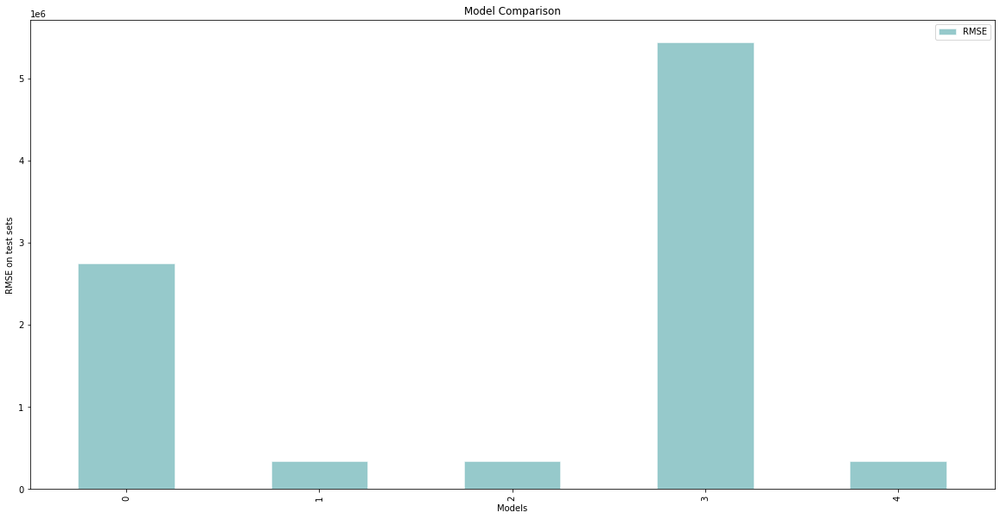

In [73]:
RESULTS.to_csv('model_results.csv', index=False)
results = pd.read_csv('model_results.csv')

results[['model','RMSE']].plot(kind='bar', color=['#2f9599'], alpha=0.5, edgecolor='#fff')
plt.title('Model Comparison')
plt.xlabel('Models')
plt.ylabel('RMSE on test sets')
results_pivot

Le BayesianRidge model est vraiment le pire, suivi par la Régression Linéaire. Le modèle ElasticNet double de très peu le HuberRegressor et le KNR.

In [78]:
elastic_net_model = grid.best_estimator_

## Pour l'application :

### Actuellement :
On ajoute une fonction de preprocessing regroupant tout :

In [80]:
def preprocessing(filepath):
    df = pd.read_csv(filepath)
    df.pop('store_and_fwd_flag')
    xlim = [-74.03, -73.77]
    ylim = [40.63, 40.85]
    df = df[(df.pickup_longitude> xlim[0]) & (df.pickup_longitude < xlim[1])]
    df = df[(df.dropoff_longitude> xlim[0]) & (df.dropoff_longitude < xlim[1])]
    df = df[(df.pickup_latitude> ylim[0]) & (df.pickup_latitude < ylim[1])]
    df = df[(df.dropoff_latitude> ylim[0]) & (df.dropoff_latitude < ylim[1])]
    df = df[df['passenger_count'] != 0]
    df['pickup_datetime'] = pd.to_datetime(df.pickup_datetime)
    df['pickup_year']= df['pickup_datetime'].dt.year
    df['pickup_month'] = df['pickup_datetime'].dt.month
    df['pickup_day']= df['pickup_datetime'].dt.day
    df['pickup_hour'] = df['pickup_datetime'].dt.hour
    df['pickup_min']= df['pickup_datetime'].dt.minute
    df['pickup_sec']=df['pickup_datetime'].dt.second

    df['dropoff_datetime'] = pd.to_datetime(df.dropoff_datetime)
    df['dropoff_year']= df['dropoff_datetime'].dt.year
    df['dropoff_month'] = df['dropoff_datetime'].dt.month
    df['dropoff_day']= df['dropoff_datetime'].dt.day
    df['dropoff_hour'] = df['dropoff_datetime'].dt.hour
    df['dropoff_min']= df['dropoff_datetime'].dt.minute
    df['dropoff_sec']=df['dropoff_datetime'].dt.second
    
    return df

Ainsi qu'une fonction pour encoder un dataset futur :

In [82]:
def hotEncoding(df):
    encoder = OneHotEncoder(sparse=False)

    df[encoder.get_feature_names(["has_vendor_id", "pick_year","pick_month","pick_day","pick_hour","pick_min", "pick_sec","drop_year","drop_month","drop_day","drop_hour","drop_min","drop_sec"])] =\
        encoder.fit_transform(df[['vendor_id','pickup_year','pickup_month','pickup_day',
                           'pickup_hour','pickup_min','pickup_sec','dropoff_year',
                           'dropoff_month','dropoff_day','dropoff_hour','dropoff_min'
                           ,'dropoff_sec']])
    df.drop(['vendor_id','pickup_year','pickup_month','pickup_day',
                           'pickup_hour','pickup_min','pickup_sec','dropoff_year',
                           'dropoff_month','dropoff_day','dropoff_hour','dropoff_min','dropoff_sec'], axis=1, inplace=True)
    return df

* Pour la **concentration de taxis dans New York** à un temps donné : 

    * trips_ongoing(excel_filepath,datetime)  Retourne une dataframe avec tous les voyages en cours à un temps donné
    * visualize_trips(df) Plot les voyages sur la carte de New York et retourne la carte

---

* Pour les **Points de concentration majeurs** sur une période donnée :

    * NbTripsByMonth(df,year) Affiche le nombre de voyages par mois
    * TripsPerMonth(dfo,month) Affiche le nombre de voyages par jour, pour le mois renseigné
    * ClustersPerMonth(dfo,month=0, week = 0, day=0, weekday = -1, hour= -1) Retourne une carte de New York avec les clusters principaux sur la période indiquée 
    
---

* Pour les **heures de pointe habituelles** :
    * HeuresDePointes(dfo,month=0, week = 0, day=0, weekday = -1) Affiche le nombre de voyages par heure sur la période indiquée
    
---

* Pour la **prédiction du temps de trajet** : 
    * elastic_net_model.predict(dataset_a_predire) Prédit le temps de trajet avec le modèle Elastic Net
    * Si besoin : preprocessing(filepath) pour pré-traiter un dataset
    * Si besoin : hotEncoding(df) pour encoder un dataset